In [1]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import numpy.ma as ma
import geopandas as gpd
import rasterio as rio
from rasterio.plot import plotting_extent
import earthpy as et
import earthpy.plot as ep
import gc
from tqdm import tqdm
from copy import deepcopy

%matplotlib inline

Things left to do: resolve the vegetated dunes/sand loss regime. Do I use a linear loss rate based on the DEM 2017-2021 data and then once a certain SL threshold is reached begin increasing the loss rate by the surface area of all pixels in the dune elevation range? To simulate that once SL hits a certain height the vegetation will start dying and freeing sand? Or some other method? I would like to keep the veg dunes in as it makes a much better looking graphic. I also need to resolve the SLR function - what does the SL and SLR curve look like? Hopefully orencio has something good for this. 

In [2]:
#Importing the DEMs into arrays 
mats_array_path = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/MATS-NCALM-corrected-DEM.tif'
with rio.open(mats_array_path) as ms:
    mats = ms.read(1, masked=False)
dunes_array_path = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/dunes-NCALM-corrected-DEM.tif'
with rio.open(dunes_array_path) as ds:
    dunes = ds.read(1, masked=False)
veg_array_path = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/Vegetated-NCALM-corrected-DEM.tif'
with rio.open(veg_array_path) as vs:
    veg = vs.read(1, masked=False)
cru_array_path = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/flats-NCALM-corrected-DEM.tif'
with rio.open(cru_array_path) as cs:
    cru = cs.read(1, masked=False)
array_path_2021 = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/NCALMcorrectedfullislandc.tif'
with rio.open(array_path_2021) as js:
    all = js.read(1, masked=False)
noveg_path = 'C:/Users/krfishe1/desktop/Research/Padre/Modelingpaper/2021/Cut DEMS/Merge_Rasters_noveg.tif'
with rio.open(noveg_path) as ns:
    no_veg = ns.read(1, masked=False)

In [3]:
veg[np.logical_or((veg > 20), (veg < 0))] = 0

In [4]:
vs_test, vs_test_transform = rio.warp.reproject(veg, np.zeros(ns.shape), dst_transform=ns.transform, src_crs=vs.crs, src_transform=vs.transform, dst_crs=ns.crs)


In [5]:
from numpy import Inf


dunes[np.logical_or((dunes > 20), (dunes < 0), (dunes == Inf))] = 0
cru[np.logical_or((cru > 20), (cru < 0), (dunes == Inf))] = 0
all[np.logical_or((all > 20), (all < 0), (all == Inf))] = 0
mats[np.logical_or((mats > 20), (mats < 0), (mats == Inf))] = 0
no_veg[np.logical_or((no_veg > 20), (no_veg < 0), (no_veg == Inf))] = 0
vs_test[np.logical_or((vs_test > 20), (vs_test < 0), (vs_test == Inf))] = 0

combined_veg = no_veg+vs_test
#combined_veg.shape
#ep.plot_bands(combined_veg,
#   title="test")

Below is just verifying that all and the combined veg+noveg is the same.

In [6]:
verify, verify_test_transform = rio.warp.reproject(all, np.zeros(vs_test.shape), dst_transform=vs_test_transform, src_crs=js.crs, src_transform=js.transform, dst_crs=ns.crs)
#ep.plot_bands(verify,
#    title="all")

In [7]:
#sub_test = verify-combined_veg
#np.count_nonzero(sub_test), sub_test.size, np.count_nonzero(sub_test)/sub_test.size*100
np.allclose(verify, combined_veg)

False

In [8]:
#plt.hist(sub_test.flatten(), bins=np.linspace(0,1,100));

In [9]:
from tkinter import ttk


j = np.linspace(0,49, num=50) #all variables in the loop are starting with an initial condition, so we run 49 years instead of 50 to get a full array. Short loop for testing for now, so only 5 years. 
sl = np.array(0.00)
slr_0 = 0.00334
slr = 0
#acc_mats = 0.0025 #accumulation rate, just made up for testing right now
#acc_flats = 0.0025
#acc_dunes = 0.001
#acc_veg = 0.002
#elev_delt_mats = 0.0025
#print(elev_delt_mats)
mat_range = np.array([0, 0.5])
cru_range = np.array([0.5, 0.8])
dune_range = np.array([0.8, 20])
veg_range = np.array([0.8, 20])
sl_log = np.geomspace(0.0034,0.05,num=50, endpoint=True)
sl_lin = np.full((50,),0.0034)
file_path_slr = "C:/Users/krfishe1/Desktop/Research/Padre/Modelingpaper/slr_estimate.txt"
SLR_txt = np.loadtxt(file_path_slr, skiprows=1) #column 1 = year, 2 = sl, 3 = sldelta
slr_proj = SLR_txt[:,2]
sl_proj = SLR_txt[:,1]
slr_proj = np.where(slr_proj < 0.013, 0.0134, slr_proj)
low_slr_curve = np.linspace(1, 0.75, num=51)
hi_slr_curve = np.linspace(1, 1.25, num=51)
hy = np.linspace(0, 50, num=51)
slr_proj_lo = slr_proj*low_slr_curve
slr_proj_hi = slr_proj*hi_slr_curve
tt = slr_proj_hi[2]-slr_proj_hi[1]
slr_proj_hi[0] = slr_proj_hi[1]-tt
kk = slr_proj_lo[2] - slr_proj_lo[1]
slr_proj_lo[0] = slr_proj_lo[1]-kk
slr_proj[0] = 0.0133
sl_proj[0] = 0.012
sl_proj_lo = sl_proj*low_slr_curve
sl_proj_hi = sl_proj*hi_slr_curve


In [10]:
file_path_hist_slr = "C:/Users/krfishe1/Desktop/Research/Padre/Modelingpaper/slr_estimate_noaa_3.txt"
SLR_hist_text = np.loadtxt(file_path_hist_slr, skiprows=1) #column 1 = year, 2 = month, 3 = monthly msl, 4 = linear trend, 5 = high conf, 6 = low conf
slr_hist = SLR_hist_text[:,2]
sl_proj_hist_avg = 0.175+sl_proj
sl_proj_hist_hi = 0.175+sl_proj_hi
sl_proj_hist_lo = 0.175+sl_proj_lo
sl_hist_avg = np.append(slr_hist, sl_proj_hist_avg)
#sl_hist_hi = np.append(slr_hist, sl_proj_hi)
#sl_hist_lo = np.append(slr_hist, sl_proj_hist_lo)
jy = np.linspace(0, 70, num=71)
ky = np.linspace(20, 70, num=51)

In [11]:
sl_proj_hist_lo[30]

0.546059

<function matplotlib.pyplot.show(close=None, block=None)>

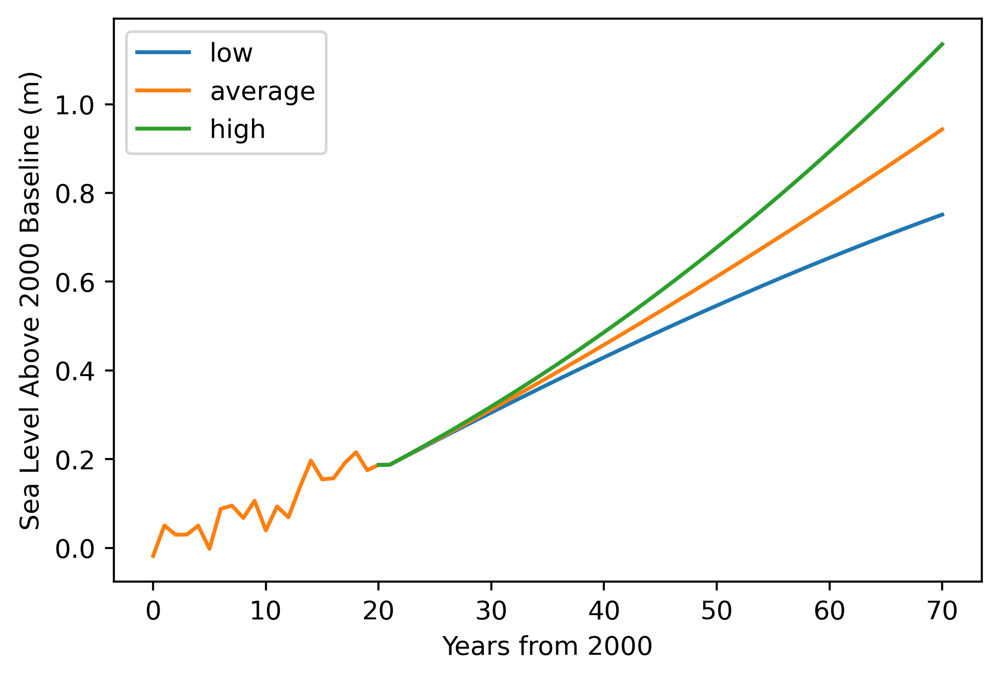

In [12]:
figslr = plt.figure(1, dpi=400)
plt.plot(ky, sl_proj_hist_lo, label='low')
plt.plot(jy, sl_hist_avg, label='average')
plt.plot(ky, sl_proj_hist_hi, label='high')
plt.legend()
plt.ylabel('Sea Level Above 2000 Baseline (m)')
plt.xlabel('Years from 2000')
plt.savefig('Historical_SL.png', dpi=400)
plt.show

In [13]:
#f1 = plt.figure(1, dpi=400)
#plt.plot(hy, sl_proj_lo, label='low')
#plt.plot(hy, sl_proj, label='average')
#plt.plot(hy, sl_proj_hi, label='high')
#plt.legend()
#plt.xlabel('Years')
#plt.ylabel('Sea Level Rise Above 2021 Baseline (m)')
#plt.savefig('SL.png', dpi=400)
#plt.show

In [14]:

for i in j:
    if i > 0:
        if i < 50:
            q = int(i)
            p = q-1
            sl_dif = sl_log[q]-sl_log[p]
            sl = np.append(sl,sl_dif)
            #sl_del = np.append(sl_del,sl_diff2)

sl2 = sl-sl_lin
#print(sl.shape)
#print(sl_del.shape)
#print('sl is: ', sl)
#print('sl2 is: ', sl2)

In [15]:
noveg_mats = np.where((no_veg>=mat_range[0]) & (no_veg<=mat_range[1]), no_veg, 0) 
noveg_mat_cov = np.array([np.count_nonzero(noveg_mats)])
noveg_cru = np.where((no_veg>cru_range[0]) & (no_veg<=cru_range[1]), no_veg, 0) 
noveg_cru_cov = np.array([np.count_nonzero(noveg_cru)])
noveg_dun = np.where((no_veg>dune_range[0]) & (no_veg<=dune_range[1]), no_veg, 0) 
noveg_dune_cov = np.array([np.count_nonzero(noveg_dun)])
noveg_water = np.where(no_veg<=0, no_veg, 0)
noveg_water_cov = np.array([np.count_nonzero(no_veg)])

noveg_mats =deepcopy(no_veg)
noveg_water = deepcopy(no_veg)
noveg_cru = deepcopy(no_veg)
noveg_dun = deepcopy(no_veg)
dune_rate = np.array([0.00035])
dune_rate_hi = 1.2*dune_rate
dune_rate_lo = 0.8*dune_rate
dune_loss = np.array([-0.02195])
dune_loss_hi = 1.2*dune_loss
dune_loss_lo = 0.8*dune_loss
#dune_rate_loss =  need to figure out how to calculate dune loss rate

In [16]:
veg_mats = np.where((vs_test>=mat_range[0]) & (vs_test<=mat_range[1]), vs_test, 0) 
veg_mat_cov = np.array([np.count_nonzero(veg_mats)])
veg_cru = np.where((vs_test>cru_range[0]) & (vs_test<=cru_range[1]), vs_test, 0) 
veg_cru_cov = np.array([np.count_nonzero(veg_cru)])
veg_veg = np.where((vs_test>dune_range[0]) & (vs_test<=dune_range[1]), vs_test, 0) 
veg_veg_cov = np.array([np.count_nonzero(veg_veg)])
veg_water = np.where(vs_test<=0, vs_test, 0)
veg_water_cov = np.array([np.count_nonzero(vs_test)])

veg_mats =deepcopy(vs_test)
veg_water = deepcopy(vs_test)
veg_cru = deepcopy(vs_test)
veg_veg = deepcopy(vs_test)

In [17]:
mat_cov = np.array([noveg_mat_cov+veg_mat_cov])
dune_cov = np.array([noveg_dune_cov])
cru_cov = np.array([noveg_cru_cov+veg_cru_cov])
veg_cov = np.array([veg_veg_cov])
water_combo = no_veg+vs_test
water_cov = np.array([np.count_nonzero(water_combo)])

In [18]:
veg_loss_rate_avg = np.full((1, 51), 0.01)
veg_loss_rate = np.full((1, 51), 0.01)
veg_loss_rate_hurricane = veg_loss_rate
veg_loss_rate_hurricane[0, 7] = -0.06
veg_loss_rate_hurricane[0, 15] = -0.06
veg_loss_rate_hurricane[0, 23] = -0.06
veg_loss_rate_hurricane[0, 31] = -0.06
veg_loss_rate_hurricane[0, 39] = -0.06
veg_loss_rate_hurricane[0, 47] = -0.06
veg_loss_rate_avg

array([[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
        0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
        0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
        0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
        0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]])

In [19]:
small_j = j[:40]
small_j

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39.])

In [20]:
j

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49.])

I need to figure out how I want to handle the veg dunes. Right now if I just use the average elev gain from 2017-2021 linearly for the whole model the veg never loses coverage. Which would be fine, but it also never gains coverage because we dont have any of the other areas gaining elevation from veg spreading (not sure how to quantify that). So therefore veg just stays completely flat the whole model which does not look correct. There should be some loss and some spread, but I dont know how to handle spatial changes. It would be nice to add some elevation to areas near the veg slowly to represent a spread, but i dont think there is a way fo rme to do that. So I am thinking maybe I slowly reduce veg growth rate over time?

In [21]:
gc.collect()
for i in tqdm(small_j): 
    p = int(i)
    no_veg = np.where((no_veg>mat_range[0]) & (no_veg<=mat_range[1]), no_veg-slr_proj[p-1]+dune_rate[p-1], no_veg) 
    no_veg = np.where((no_veg>cru_range[0]) & (no_veg<=cru_range[1]), no_veg-slr_proj[p-1]+dune_rate[p-1], no_veg)
    no_veg = np.where((no_veg>dune_range[0]) & (no_veg<=dune_range[1]), no_veg-slr_proj[p-1]+dune_loss[p-1], no_veg)   
    all_mats = np.where((no_veg>mat_range[0]) & (no_veg<=mat_range[1]), no_veg, 0) 
    all_cru = np.where((no_veg>cru_range[0]) & (no_veg<=cru_range[1]), no_veg, 0) 
    all_dun = np.where((no_veg>dune_range[0]) & (no_veg<=dune_range[1]), no_veg, 0) 
    #all_water = np.where(no_veg<=0, no_veg, 0) 

    vs_test = np.where((vs_test>mat_range[0]) & (vs_test<=mat_range[1]), vs_test-slr_proj[p-1]+dune_rate[p-1], vs_test) 
    vs_test = np.where((vs_test>cru_range[0]) & (vs_test<=cru_range[1]), vs_test-slr_proj[p-1]+dune_rate[p-1], vs_test)
    vs_test = np.where((vs_test>veg_range[0]) & (vs_test<=veg_range[1]), vs_test-slr_proj[p-1]+veg_loss_rate_avg[:, p-1], vs_test)   #need to iteratio on veg dune rate
    veg_mats = np.where((vs_test>mat_range[0]) & (vs_test<=mat_range[1]), vs_test, 0) 
    veg_cru = np.where((vs_test>cru_range[0]) & (vs_test<=cru_range[1]), vs_test, 0) 
    veg_veg = np.where((vs_test>veg_range[0]) & (vs_test<=veg_range[1]), vs_test, 0) 
    water_combo = no_veg+vs_test
    

    water_cov = np.append(water_cov, np.count_nonzero(water_combo==0) + np.count_nonzero(water_combo<0))
    mat_cov = np.append(mat_cov, np.count_nonzero(all_mats)+np.count_nonzero(veg_mats))
    cru_cov = np.append(cru_cov, np.count_nonzero(all_cru)+np.count_nonzero(veg_cru))
    dune_cov = np.append(dune_cov, np.count_nonzero(all_dun))
    veg_cov = np.append(veg_cov, np.count_nonzero(veg_veg))
    dune_loss_ratio = dune_loss[0] # dune_loss_ratio = dune_loss[0]*(dune_cov[p]/dune_cov[0]) changed to dune_loss_ratio = dune_loss[0] per ODV
    #veg_dune_loss_ratio = veg_loss_rate_hurricane[p-1]*(veg_cov[p]/veg_cov[0])
    cov_ratio = (mat_cov[0]+cru_cov[0])/(mat_cov[p-1]+cru_cov[p-1])  #FAR equations
    dune_acc_ratio = (dune_rate[0]*dune_loss_ratio)*cov_ratio  #FAR , edits here
    dune_acc_ratio2 = dune_loss_ratio*(dune_cov[p-1]/(mat_cov[p-1]+cru_cov[p-1])) #ODV proposed FAR, double check
    dune_loss = np.append(dune_loss, dune_loss_ratio)
    #dune_loss_hi = np.append(dune_loss_hi, dune_loss_ratio)
    #dune_loss_lo = np.append(dune_loss_lo, dune_loss_ratio)
    dune_rate = np.append(dune_rate, dune_acc_ratio2)  #FAR
    #dune_rate_hi = np.append(dune_rate_hi, dune_acc_ratio)
    #dune_rate_lo = np.append(dune_rate_lo, dune_acc_ratio)
    gc.collect() #garbage collector


print('Crust size is:', cru_cov.shape)
print('Dune size is:', dune_cov.shape)     
print('water size is:', water_cov.shape)
print('Mat size is:', mat_cov.shape)

100%|██████████| 40/40 [03:48<00:00,  5.71s/it]

Crust size is: (41,)
Dune size is: (41,)
water size is: (41,)
Mat size is: (41,)


In [22]:
dune_rate

array([ 0.00035   , -0.00195355, -0.00250017, -0.00195355, -0.00159568,
       -0.00134772, -0.00117367, -0.0010375 , -0.00092957, -0.00084418,
       -0.00077616, -0.0007107 , -0.00066489, -0.00062815, -0.00059471,
       -0.00056258, -0.00053295, -0.00050526, -0.00047957, -0.00045614,
       -0.0004336 , -0.00041265, -0.00039502, -0.00037992, -0.00036702,
       -0.00035621, -0.00034643, -0.00033897, -0.00033674, -0.00034147,
       -0.00034905, -0.00035477, -0.00035782, -0.0003595 , -0.0003598 ,
       -0.00035971, -0.00035997, -0.00036108, -0.00036392, -0.00036844,
       -0.00037458])

In [23]:
water_cov[0] = water_cov[1]

ValueError: x and y must have same first dimension, but have shapes (51,) and (41,)

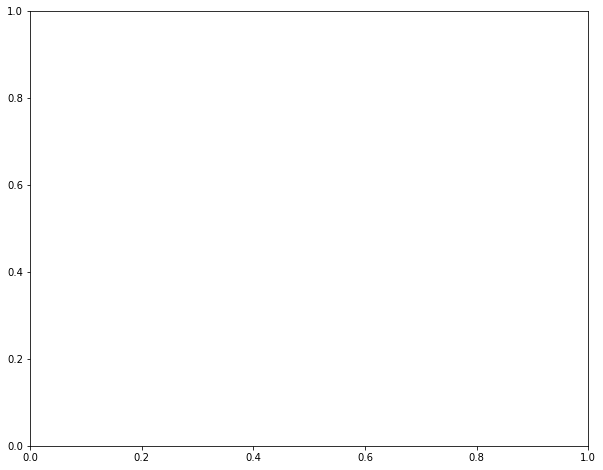

In [24]:
plt.figure(figsize=(10, 8))
years = np.arange(0,len(j)+1,step=1, dtype=int)

f1 = plt.figure(1, dpi=400)
#plt.figure(figsize=(5, 2.7), layout='constrained')
plt.plot(years, water_cov, label='Water', linewidth='2.5')
plt.plot(years, dune_cov, label='Back-island Dunes', linewidth='2.5')
plt.plot(years, mat_cov, label='Microbial Mats', linewidth='2.5')
plt.plot(years, cru_cov, label='Microbial Crusts and Wet Sand', linewidth='2.5')
plt.plot(years, veg_cov, label='Vegetated Dunes', linewidth='2.5')
plt.xlabel('Years', fontsize=18)
plt.ylabel('Facies Coverage (sq/m)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(prop={'size': 16}, loc='upper left')
plt.title('40 year SLR Scenario', fontsize=18)
plt.savefig('40yr_slr_cov.png', dpi=400)
f1.show()

#f2 = plt.figure(2)
#plt.figure(figsize=(5, 2.7), layout='constrained')
#plt.plot(years, dune_rate, label='Dune accretion')
#plt.plot(years, sl, label='SLR')
#plt.xlabel('years')
#plt.ylabel('Loss rate')
#plt.legend(loc='upper right')
#f2.show()


In [25]:
np.arange(0,len(small_j)+1,step=1, dtype=int)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40])

Change the colors so I can tell where water is vs mats. Color code is not clear right now. Make water black. 

In [26]:
from matplotlib.pyplot import cm, viridis


#everything = no_veg+vs_test
bins = [-np.Inf, 0, 0.5, 0.8, 20]
im_arr_bin = np.digitize(no_veg, bins, right=True)
im_arr_bin2 = np.digitize(vs_test, bins, right=True)
im_arr_bin2 = np.where(im_arr_bin2 == 4, im_arr_bin2+1, im_arr_bin2)
both = im_arr_bin+im_arr_bin2
both = both-1
#facies_names1 = ["Water", "Mats", "Flats/Crusts", "Dunes", "Other"]
facies_names2 = ["Water", "Microbial Mats", "Microbial Crusts and Wet Sand", "Back-island Dunes", "Vegetated Dunes"]
fig, ax = plt.subplots(1, 1, figsize=(12,12), dpi=800)
im_ax = ax.imshow(both, cmap='terrain')
leg_neg = ep.draw_legend(im_ax = im_ax, titles = facies_names2, bbox=(0.05, 0.2))
plt.savefig('SLR_40yr.png', dpi=800)
plt.show()


